<a href="https://colab.research.google.com/github/Kalashshetty/Water_quality-using-ai-ml-components/blob/main/Water_Quality.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#from google.colab import drive
#drive.mount("/content/drive")

Data Cleaning and Preprocessing:

In [ ]:
import pandas as pd

# Load the dataset
file_path = "/content/waterQuality1.csv"
water_quality_data = pd.read_csv(file_path)

# Display basic information about the dataset
print("Dataset shape:", water_quality_data.shape)
print("\nColumn names:", water_quality_data.columns)


Dataset shape: (7999, 21)

Column names: Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'is_safe'],
      dtype='object')


In [ ]:
# Check for missing values
missing_values_count = water_quality_data.isnull().sum()
print("\nMissing values count:\n", missing_values_count)

# Impute missing values (for numeric columns, using mean imputation)
water_quality_data.fillna(water_quality_data.mean(), inplace=True)


In [ ]:
# Check for and remove duplicates
initial_duplicates = water_quality_data.duplicated().sum()
print("\nInitial duplicates count:", initial_duplicates)

# Remove duplicates
water_quality_data.drop_duplicates(inplace=True)



Initial duplicates count: 0


In [ ]:
from scipy import stats

# Calculate z-scores for each numeric column
z_scores = stats.zscore(water_quality_data.select_dtypes(include=['float64']))

# Define a threshold for outlier detection (e.g., z-score > 3 or < -3)
outlier_threshold = 3

# Identify outliers
outliers = (abs(z_scores) > outlier_threshold).any(axis=1)

# Remove outliers
water_quality_data = water_quality_data[~outliers]


Exploratory Data Analysis:

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the preprocessed dataset
file_path = "/content/waterQuality1.csv"
water_quality_data = pd.read_csv(file_path)

# Display basic information about the dataset
print("Dataset shape:", water_quality_data.shape)
print("\nColumn names:", water_quality_data.columns)


Dataset shape: (7999, 21)

Column names: Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'is_safe'],
      dtype='object')


In [ ]:
# Calculate descriptive statistics
descriptive_stats = water_quality_data.describe()
print("\nDescriptive statistics:\n", descriptive_stats)



Descriptive statistics:
          aluminium      arsenic       barium      cadmium   chloramine  \
count  7999.000000  7999.000000  7999.000000  7999.000000  7999.000000   
mean      0.666158     0.161445     1.567715     0.042806     2.176831   
std       1.265145     0.252590     1.216091     0.036049     2.567027   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.040000     0.030000     0.560000     0.008000     0.100000   
50%       0.070000     0.050000     1.190000     0.040000     0.530000   
75%       0.280000     0.100000     2.480000     0.070000     4.240000   
max       5.050000     1.050000     4.940000     0.130000     8.680000   

          chromium       copper     flouride     bacteria      viruses  \
count  7999.000000  7999.000000  7999.000000  7999.000000  7999.000000   
mean      0.247226     0.805857     0.771565     0.319665     0.328583   
std       0.270640     0.653539     0.435373     0.329485     0.378096   
min       0

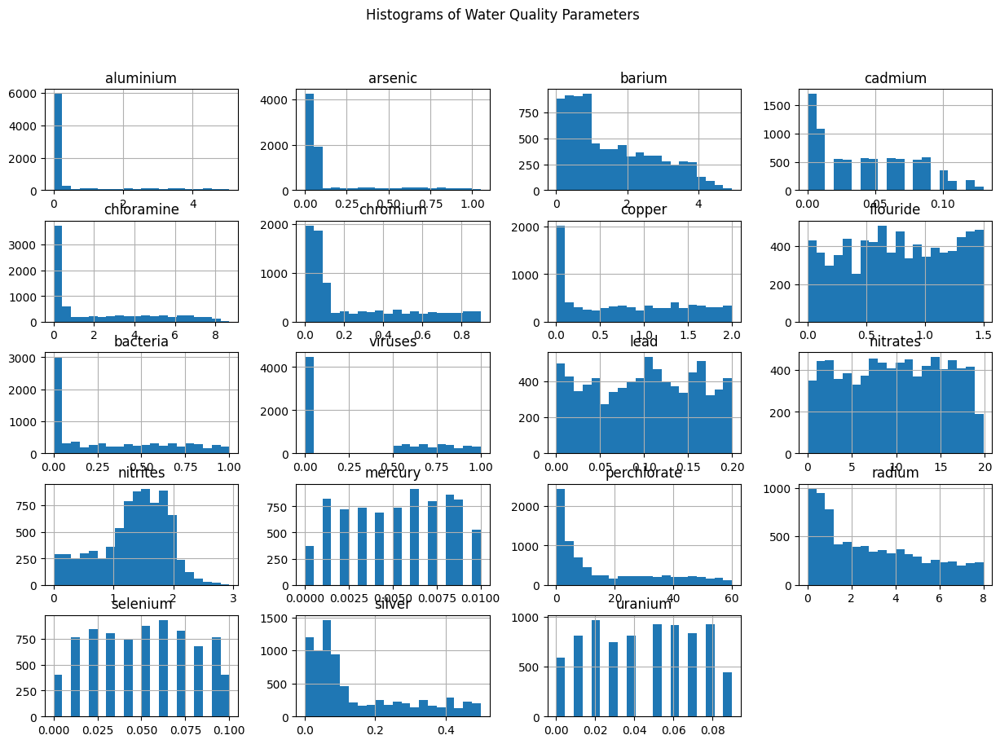

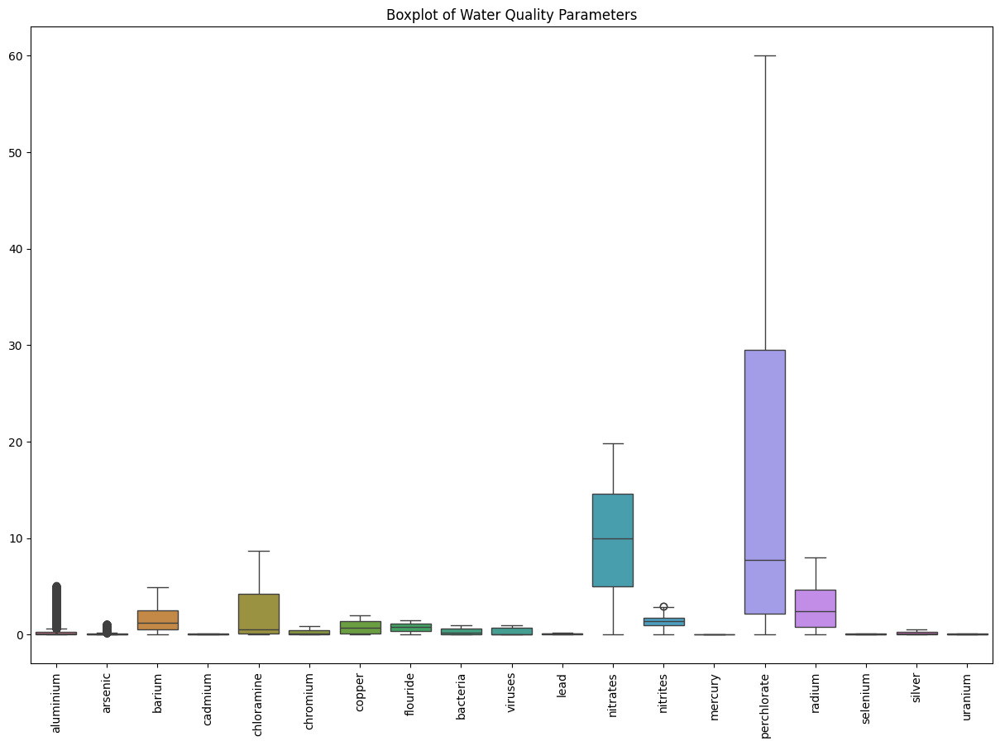

In [ ]:
# Visualize distributions of individual variables using histograms
water_quality_data.hist(bins=20, figsize=(15, 10))
plt.suptitle("Histograms of Water Quality Parameters")
plt.show()

# Visualize distributions using box plots
plt.figure(figsize=(15, 10))
sns.boxplot(data=water_quality_data)
plt.title("Boxplot of Water Quality Parameters")
plt.xticks(rotation=90)
plt.show()



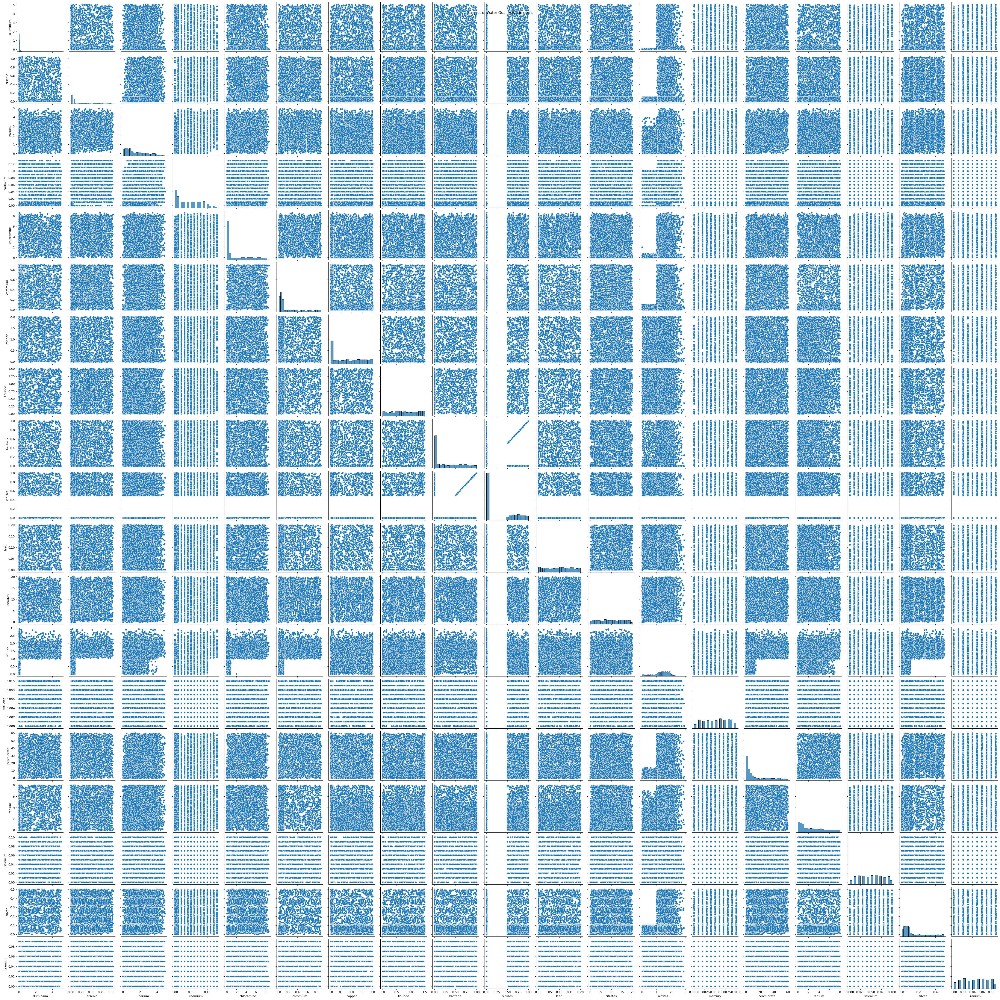

ValueError: could not convert string to float: '#NUM!'

In [ ]:
# Explore relationships between pairs of variables using scatter plots
sns.pairplot(water_quality_data)
plt.suptitle("Pairplot of Water Quality Parameters")
plt.show()

# Calculate and visualize correlation matrix
correlation_matrix = water_quality_data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Water Quality Parameters")
plt.show()


Linear Regression for Predicting Water Quality Parameters:

In [ ]:
# Replace '#NUM!' with NaN
water_quality_data.replace('#NUM!', float('nan'), inplace=True)

# Drop rows with NaN values
water_quality_data.dropna(inplace=True)

# Now, we can proceed with the machine learning algorithms as before


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Assume 'is_safe' as the target variable to predict
X = water_quality_data.drop(columns=['is_safe'])  # Features
y = water_quality_data['is_safe']  # Target variable

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the linear regression model
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)

# Predict safety labels on the testing set
y_pred_lr = model_lr.predict(X_test)

# Evaluate the model
mse_lr = mean_squared_error(y_test, y_pred_lr)
print("Mean Squared Error (Linear Regression):", mse_lr)


Random Forest Classifier for Water Safety Prediction:

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Assume 'is_safe' as the target variable to predict
X = water_quality_data.drop(columns=['is_safe'])  # Features
y = water_quality_data['is_safe']  # Target variable

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the random forest classifier
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# Predict safety labels on the testing set
y_pred_rf = model_rf.predict(X_test)

# Evaluate the model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Accuracy (Random Forest Classifier):", accuracy_rf)
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf))
